# Customer Segmentation

### Machine Learning II Project

   - Bruno Moreira            | 20211574@novaims.unl.pt
   - Carolina Braziel Shaul   | 20211557@novaims.unl.pt
   - Madalena Dias Frango     | 20211522@novaims.unl.pt

## Table of Contents

<br>
[2. Preliminary Data Adjustments](#2. bullet)<br>
<br>
[3. Customer Segmentation - K-Means](#3.-bullet)<br>
<br>

<br>

---
<br>

<a class="anchor" id="1-bullet">     
    

### 1. Importing Data & Libraries 

</a>


In [1]:
#Basic Packages
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from datetime import date 
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import KMeans
from sklearn.metrics import confusion_matrix
import pickle


#Plot Maps
import folium
from folium.plugins import HeatMap, MarkerCluster 

#Functions
import Functions

# Umap library
import umap

%load_ext autoreload
%autoreload 2

#Ignore warnings
import warnings
warnings.filterwarnings("ignore")


# Matplotlib Options
plt.rcParams['figure.figsize'] = [16, 8]
font = {'weight' : 'bold',
        'size'   : 14}
plt.rc('font', **font)

c:\Users\carolinashaul\AppData\Local\Programs\Python\Python310\lib\site-packages\umap\distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
c:\Users\carolinashaul\AppData\Local\Programs\Python\Python310\lib\site-packages\umap\distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
c:\Users\carolinashaul\AppData\Local

In [2]:
individuals = pd.read_csv('clientes_preprocessed.csv')
transactions = pd.read_csv('Customer Basket Dataset.csv')
prod_mapping = pd.read_excel('Product Mapping Excel File.xlsx')

In [3]:
individuals.set_index('customer_id', inplace=True)

<br>

---
<br>

<a class="anchor" id="2.-bullet">     
    

### 2. Preliminary Data Adjustments

</a>

#### Joining Features

In [4]:
individuals['lifetime_spend_animal_protein'] = individuals[['lifetime_spend_fish', 'lifetime_spend_meat']].sum(axis=1)
individuals['lifetime_spend_technology'] = individuals[['lifetime_spend_videogames', 'lifetime_spend_electronics']].sum(axis=1)

In [5]:
corr_matrix = individuals.drop(['lifetime_spend_fish', 'lifetime_spend_meat', 'lifetime_spend_videogames', 'lifetime_spend_electronics'], axis = 1).corr()
Functions.get_high_correlations(corr_matrix, 0.66)

,Variable 1,Variable 2,Correlation
10,lifetime_total_distinct_products,lifetime_spend_animal_protein,0.932928
3,lifetime_spend_groceries,lifetime_total_distinct_products,0.926119
2,distinct_stores_visited,percentage_of_products_bought_promotion,0.923021
6,lifetime_spend_groceries,lifetime_spend_animal_protein,0.915666
5,lifetime_spend_groceries,total_lifetime_spend,0.913175
0,kids_home,minors_in_household,0.895671
11,total_lifetime_spend,lifetime_spend_animal_protein,0.872337
9,lifetime_total_distinct_products,total_lifetime_spend,0.855891
1,teens_home,minors_in_household,0.799848
7,lifetime_spend_nonalcohol_drinks,lifetime_spend_technology,0.787628


In [6]:
continuous = ['lifetime_spend_groceries', 'lifetime_spend_electronics', 'lifetime_spend_vegetables',
       'lifetime_spend_nonalcohol_drinks', 'lifetime_spend_alcohol_drinks',
       'lifetime_spend_meat', 'lifetime_spend_fish', 'lifetime_spend_hygiene',
       'lifetime_spend_videogames', 'lifetime_total_distinct_products',
       'percentage_of_products_bought_promotion', 'year_first_transaction', 'total_lifetime_spend', 'age', 'birthday' ]

#Variaveis tais como 'lifetime_total_distinct_products', 'year_first_transaction', 
#  'age', 'birthday', estão a ser tratadas como continuas neste contexto dada a amplitude delas.

discrete = ['kids_home', 'teens_home', 'typical_hour', 'birthmonth',
       'number_complaints', 'distinct_stores_visited', 'minors_in_household', 'education']

binary = ['customer_gender', 'loyalty_card']

#### Data Scalling

In [7]:
scaler = MinMaxScaler()
individuals_num = individuals.drop(['customer_name', 'region'], axis=1)
scaled_data = scaler.fit_transform(individuals_num)
scaled_data = pd.DataFrame(scaled_data, index= individuals_num.index, columns=individuals_num.columns)

<br>

---
<br>

<a class="anchor" id="3.-bullet">     
    

### 3. Customer Segmentation - K-Means

</a>

> Selecting the columns to use to plot by

In [8]:
columns = ['lifetime_spend_groceries', 'lifetime_spend_electronics', 'lifetime_spend_vegetables',
 'lifetime_spend_nonalcohol_drinks', 'lifetime_spend_alcohol_drinks', 'lifetime_spend_hygiene',
 'lifetime_spend_videogames', 'lifetime_total_distinct_products', 'percentage_of_products_bought_promotion',
 'year_first_transaction', 'total_lifetime_spend', 'age', 'kids_home', 'teens_home',
 'typical_hour', 'number_complaints','distinct_stores_visited', 'minors_in_household']

In [9]:
colors = ['#F29687','#5D64AC','#EFD56C','#B5699C','#569F6E', '#5D0000']

<a class="anchor" id="3.1-bullet">     
    

#### 3.1. Finding Optimal Number of Clusters and Fitting the Model
</a>

This clustering solution is characterized by using the following variables for segmentation and forming 6 clusters.

> 'kids_home', 'teens_home', 'number_complaints',
 'distinct_stores_visited', 'lifetime_spend_groceries', 'typical_hour',
 'lifetime_spend_vegetables','lifetime_spend_nonalcohol_drinks','lifetime_spend_alcohol_drinks',
 'lifetime_spend_hygiene','lifetime_total_distinct_products','percentage_of_products_bought_promotion',
 'year_first_transaction','loyalty_card','total_lifetime_spend',
 'education','lifetime_spend_animal_protein','lifetime_spend_videogames', 'lifetime_spend_electronics'

In [10]:
fit_variables = ['kids_home', 'teens_home', 'number_complaints',
 'distinct_stores_visited', 'lifetime_spend_groceries', 'typical_hour',
 'lifetime_spend_vegetables','lifetime_spend_nonalcohol_drinks','lifetime_spend_alcohol_drinks',
 'lifetime_spend_hygiene','lifetime_total_distinct_products','percentage_of_products_bought_promotion',
 'year_first_transaction','loyalty_card','total_lifetime_spend',
 'education','lifetime_spend_animal_protein','lifetime_spend_videogames', 'lifetime_spend_electronics']

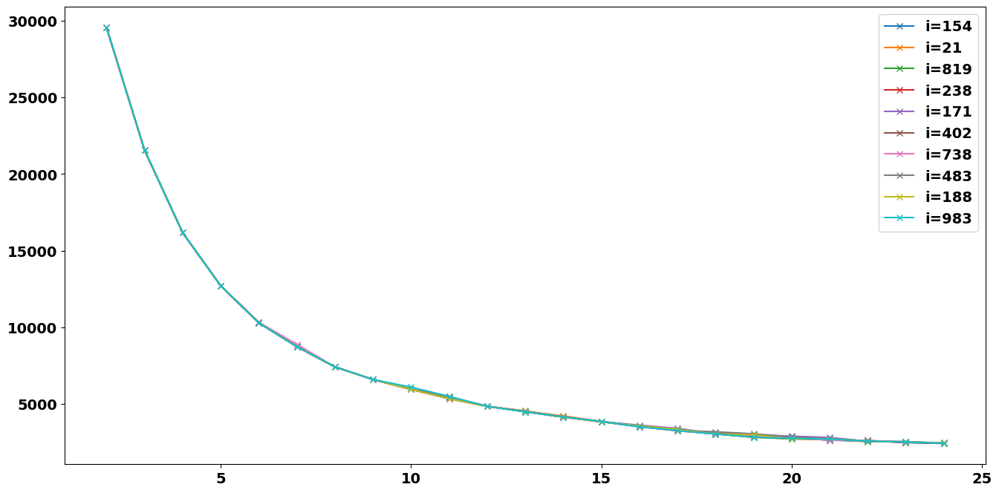

In [11]:
Functions.plot_inertia(scaled_data[fit_variables], 25, 10)

In [12]:
#kmeans_solZ = KMeans(n_clusters=6, random_state=42).fit(scaled_data[fit_variables])
#individuals['cluster_kmeansZ'] =  kmeans_solZ.predict(scaled_data[fit_variables])

In [13]:
#pickle.dump(kmeans_solZ, open('kmeans_solutionz.sav', 'wb'))

In [12]:
solutionz = pickle.load(open('kmeans_solutionz.sav', 'rb'))

In [13]:
individuals['cluster_kmeansZ'] =  solutionz.predict(scaled_data[fit_variables])

<a class="anchor" id="3.2.-bullet">     
    

#### 3.2. Assessing the Results
</a>

In [14]:
individuals_num = individuals.drop(['customer_name', 'region'], axis=1)

> Now let's assess the results using the UMAP and Silhuette method.

##### UMAP

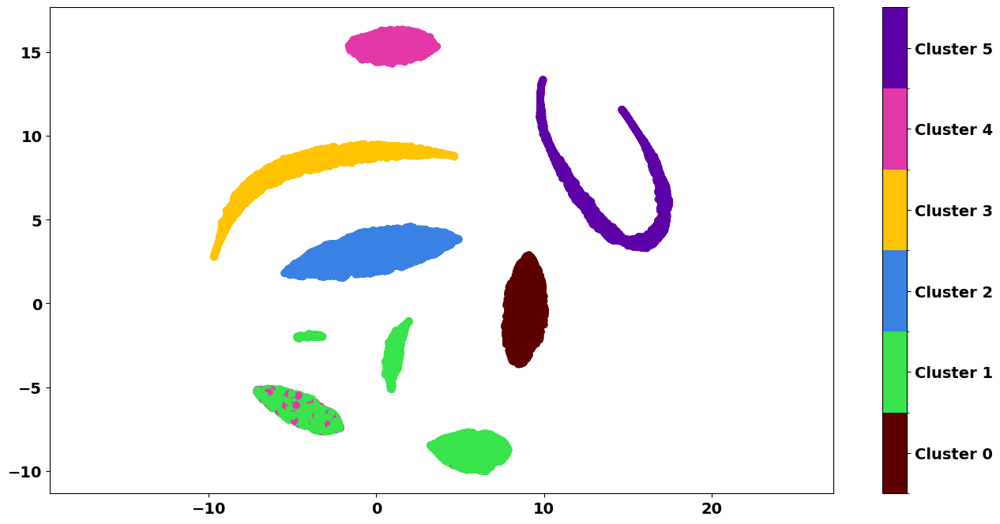

In [24]:
Functions.umap_plot(individuals_num, 'cluster_kmeansZ')

#### Silhouette Method

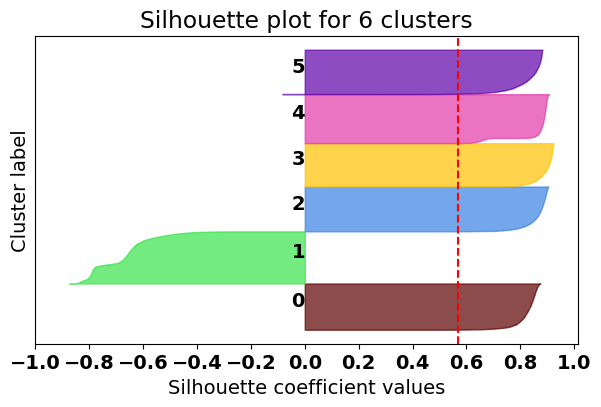

Silhouette score for 6 clusters: 0.5682


In [25]:
Functions.silhoette_method(individuals_num, 'cluster_kmeansZ')

In [26]:
abnormal2= 1
abnormal3 = 4

> It seems that all clusters - with exceptions to cluster 1 - are pretty well defined. A group of observations belonging to cluster 4 appear to fit better on cluster 1. Let's analyze the observations within both these segments to determine what can be done to define them better.

<a class="anchor" id="3.3.-bullet">     
    

#### 3.3. Analyzing the Segments
</a>

In [27]:
Functions.compare_clusters(individuals, 'cluster_kmeansZ')

,0,1,2,3,4,5,general_mean
customer_gender,0.491567,0.499007,0.499790,0.494143,0.503549,0.490370,0.496574
kids_home,1.000203,0.289478,0.997901,0.689588,2.773643,1.160423,1.155404
teens_home,0.069904,0.240931,0.271620,0.068547,1.621907,0.771217,0.516827
number_complaints,1.010567,0.437827,1.551008,0.500000,0.838097,0.310899,0.770169
distinct_stores_visited,20.001829,2.260422,7.999580,1.992625,3.010934,2.000212,6.159636
lifetime_spend_groceries,302.959764,2463.876737,14993.307935,200.406291,5208.133321,997.506878,4008.813629
lifetime_spend_electronics,20.000000,567.170727,199.970403,4999.557484,283.368310,50.364656,972.556727
typical_hour,8.991668,17.008302,11.914568,20.951844,17.562440,9.983492,14.461107
lifetime_spend_vegetables,300.231863,258.496481,799.560034,20.033623,581.569538,1499.006138,568.474340
lifetime_spend_nonalcohol_drinks,300.431823,298.580762,900.786104,1500.946855,848.445809,20.204233,633.505206


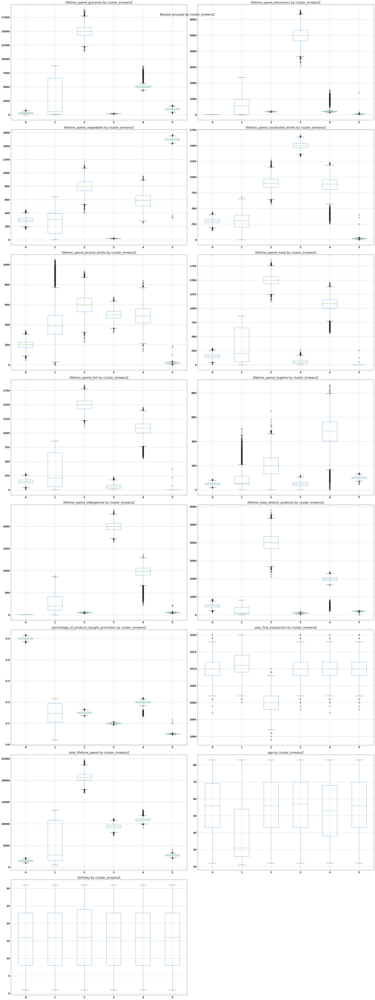

In [28]:
Functions.boxplot_by(individuals, continuous, 'cluster_kmeansZ')

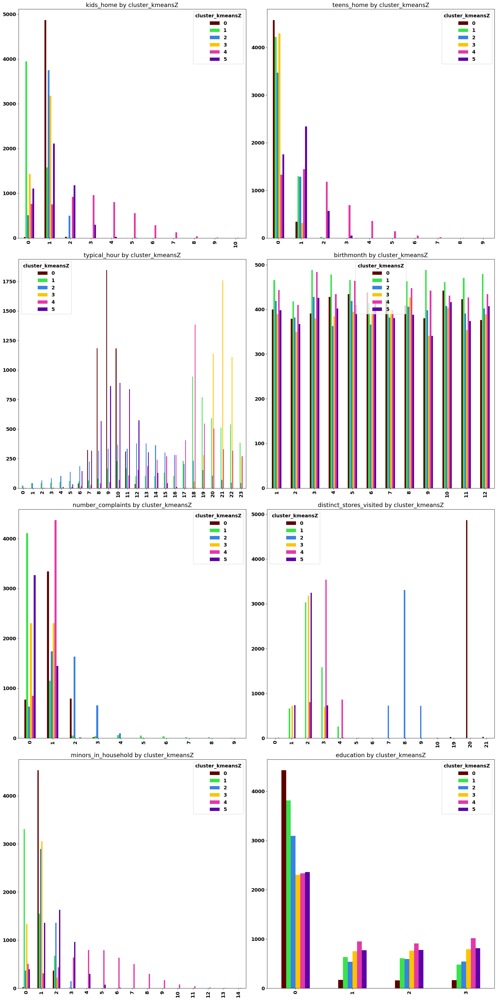

In [30]:
Functions.barplot_by(individuals, discrete, 'cluster_kmeansZ')

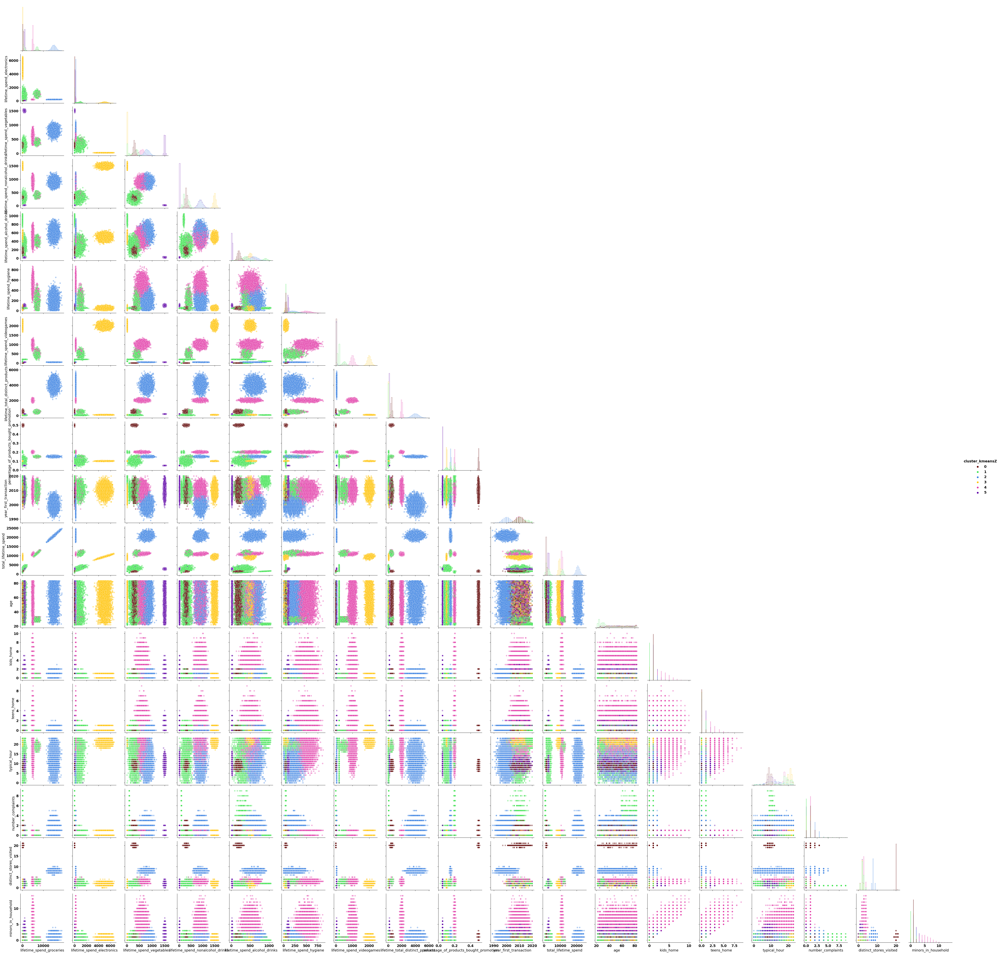

In [38]:
columns.append('cluster_kmeansZ')
Functions.pairplot(individuals, columns, 'cluster_kmeansZ', sampling=0)

In [39]:
columns.remove('cluster_kmeansZ')

> The hypothesis that all clusters seem well defined with exceptions to Cluster 1 holds. 

<a class="anchor" id="3.4.-bullet">     
    

#### 3.4. Adjusting the Segments
</a>

> To understand how can this cluster be improved, lets analyze solely the observations from cluster 1 and 4.

In [40]:
customers_subset = individuals[(individuals['cluster_kmeansZ'] == abnormal2) |( individuals['cluster_kmeansZ'] == abnormal3)]

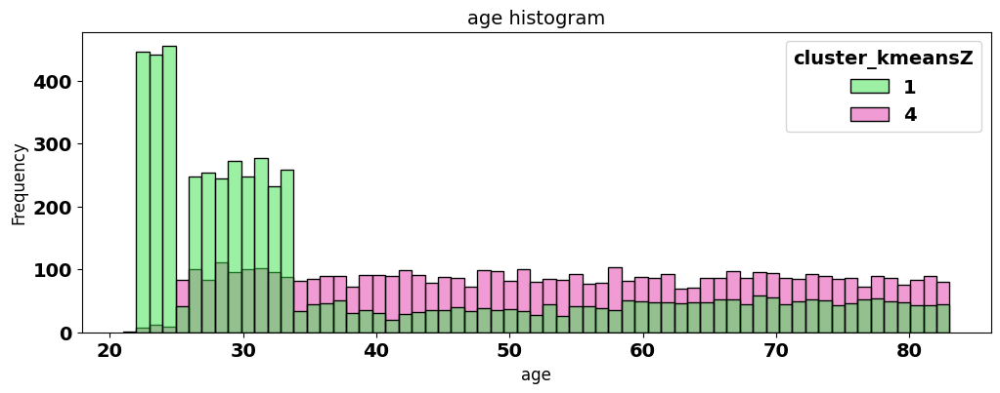

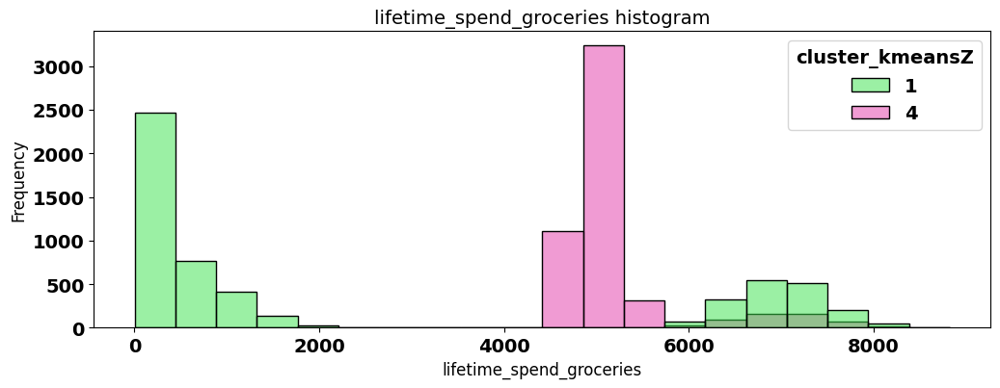

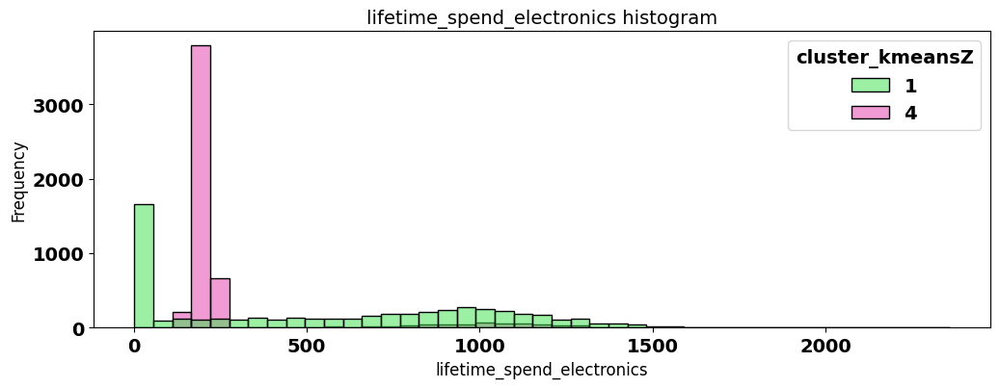

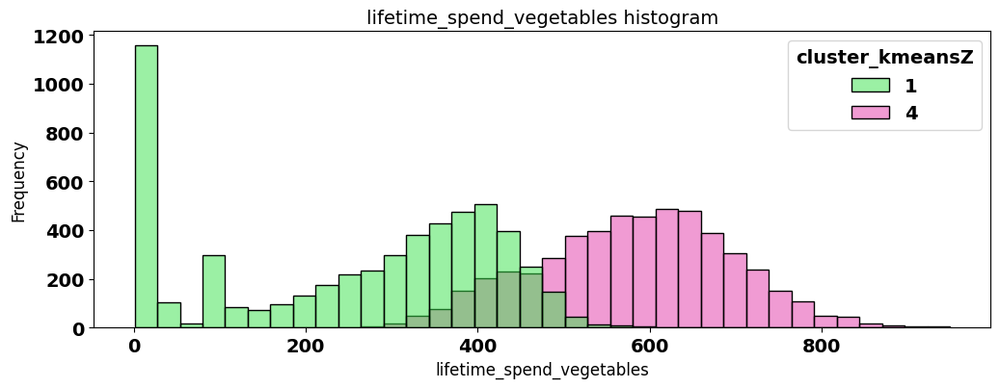

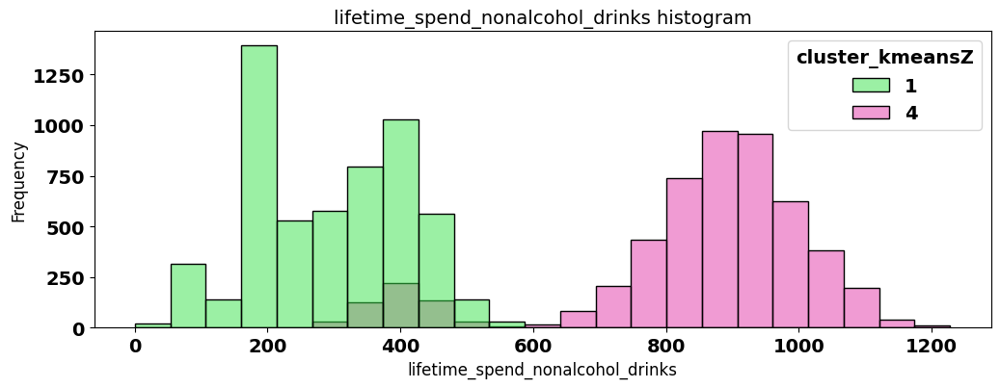

...

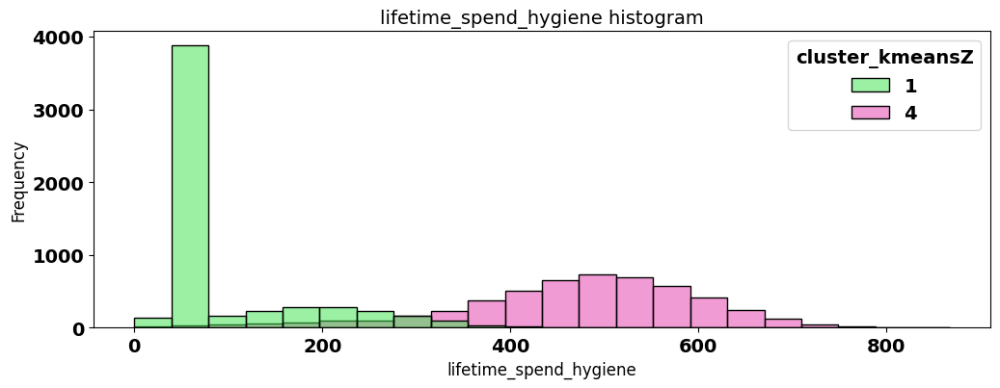

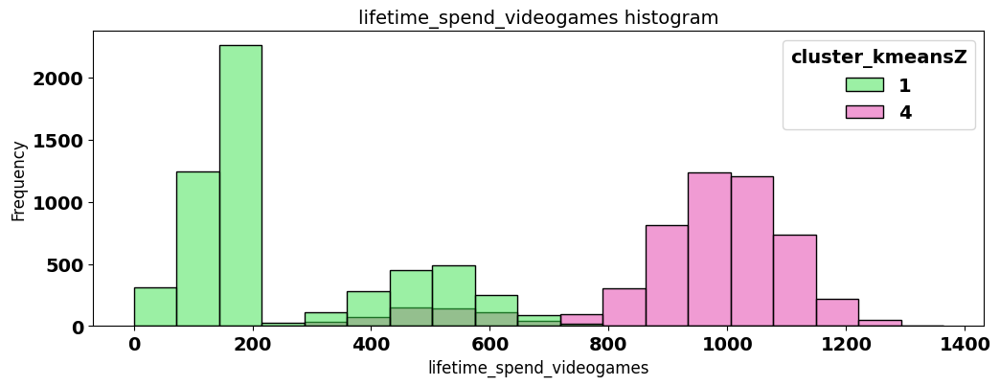

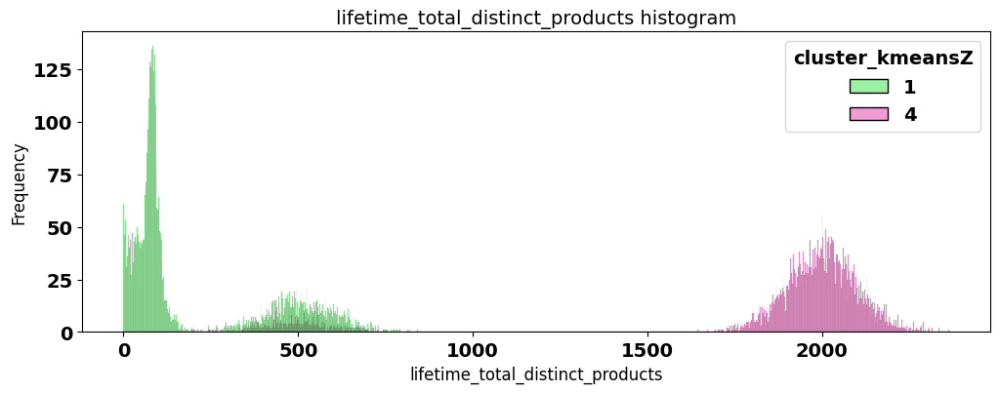

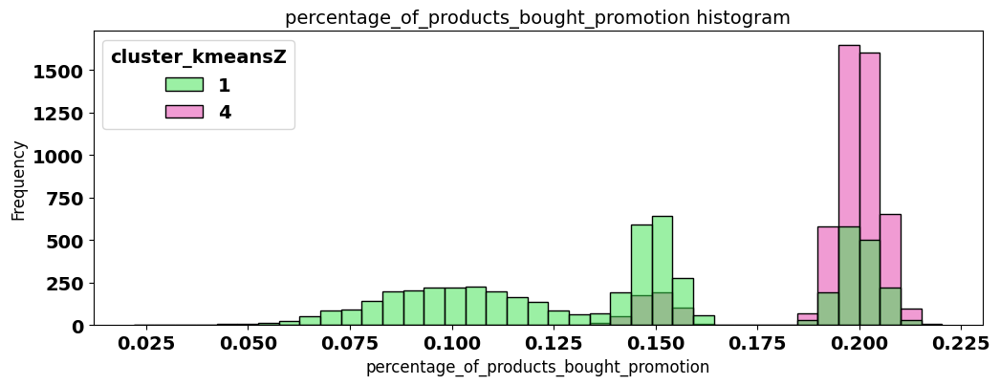

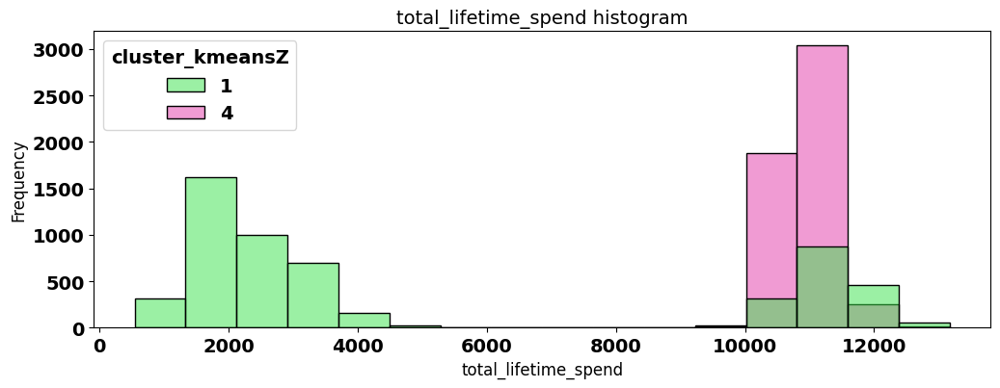

In [42]:
Functions.plot_histograms(customers_subset, cols= ['age','lifetime_spend_groceries', 'lifetime_spend_electronics', 'lifetime_spend_vegetables',
                              'lifetime_spend_nonalcohol_drinks', 'lifetime_spend_alcohol_drinks', 'lifetime_spend_meat', 'lifetime_spend_fish',
                              'lifetime_spend_hygiene', 'lifetime_spend_videogames', 'lifetime_total_distinct_products',
                              'percentage_of_products_bought_promotion', 'total_lifetime_spend'], hue_var='cluster_kmeansZ')

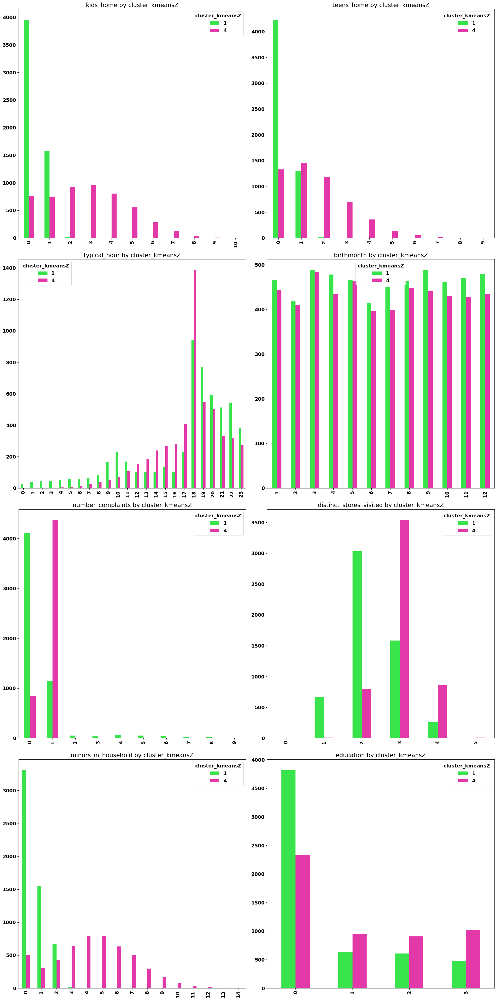

In [43]:
Functions.barplot_by(customers_subset, discrete, 'cluster_kmeansZ')

> In terms of demographic features, it appears that there is not much to distinguish this cluster, perhaps with exception to the number of minors in the household. However, in regards to expenditure, many product categories present a bimodal distribution. For this reason, another K-Means instance will be applied to this group of customers, using only features within this scope.

In [44]:
fit_variables0 = ['lifetime_spend_groceries', 'lifetime_spend_electronics', 'lifetime_spend_vegetables', 
                  'lifetime_spend_nonalcohol_drinks', 'lifetime_spend_alcohol_drinks', 'lifetime_spend_hygiene',
                  'lifetime_spend_videogames', 'lifetime_total_distinct_products','total_lifetime_spend',  'lifetime_spend_animal_protein']

In [45]:
customers_subset = individuals[(individuals['cluster_kmeansZ'] == abnormal2) |( individuals['cluster_kmeansZ'] == abnormal3)]

> As we are only now using expenditure per category variables, and they are all in the same unit, no scalling was applied to the data.

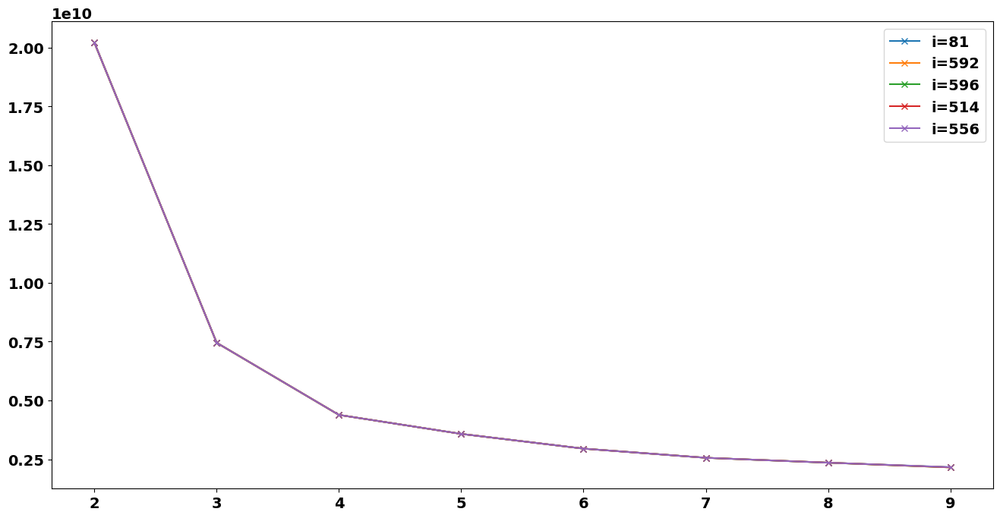

In [46]:
Functions.plot_inertia(customers_subset[fit_variables0], 10, 5)

> Although the prior analysis' suggested that there are two clusters within the segment being adjusted, let's experiment with both two and three clusters.

In [32]:
#subcluster_k2 = KMeans(n_clusters=2, random_state=0).fit(customers_subset[fit_variables0])
#pickle.dump(subcluster_k2, open('subcluster_k2.sav', 'wb'))

In [47]:
subcluster_k2 = pickle.load(open('subcluster_k2.sav', 'rb'))
customers_subset['cluster_kmeans2'] =  subcluster_k2.predict(customers_subset[fit_variables0])

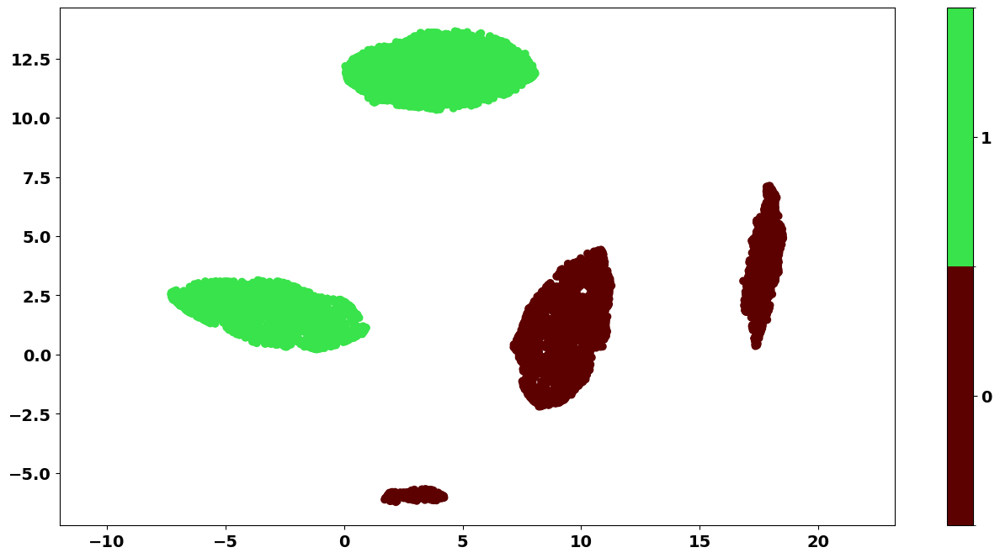

In [48]:
Functions.umap_plot(customers_subset.drop(['region', 'customer_name'], axis=1), 'cluster_kmeans2')

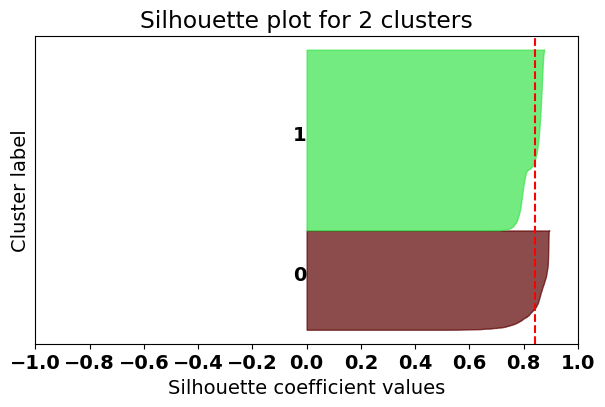

Silhouette score for 2 clusters: 0.8437


In [49]:
Functions.silhoette_method(customers_subset.drop(['region', 'customer_name'], axis=1), 'cluster_kmeans2')

In [36]:
# subcluster_k3 = KMeans(n_clusters=3, random_state=0).fit(customers_subset[fit_variables0])
# pickle.dump(subcluster_k3, open('subcluster_k3.sav', 'wb'))

In [50]:
subcluster_k3 = pickle.load(open('subcluster_k3.sav', 'rb'))
customers_subset['cluster_kmeans3'] =  subcluster_k3.predict(customers_subset[fit_variables0])

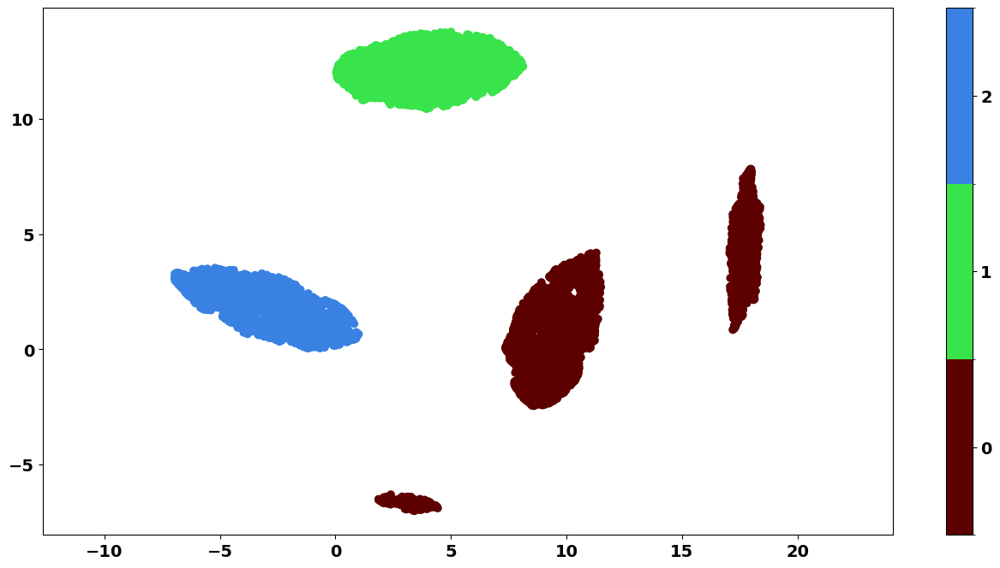

In [51]:
Functions.umap_plot(customers_subset.drop(['region', 'customer_name'], axis=1), 'cluster_kmeans3')

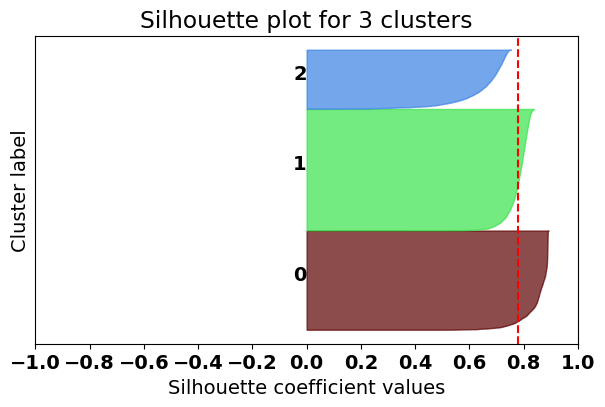

Silhouette score for 3 clusters: 0.7788


In [52]:
Functions.silhoette_method(customers_subset.drop(['region', 'customer_name'], axis=1), 'cluster_kmeans3')

> Both segmentations defined Cluster 0 . Now let's comprehend whether Cluster 1 and Cluster 2 are truly that different, or if they can be summarized into one type of client.

In [53]:
Functions.compare_clusters(customers_subset, 'cluster_kmeans3')

,0,1,2,general_mean
customer_gender,0.497510,0.500321,0.509251,0.501209
kids_home,0.347051,3.077533,0.162996,1.493677
teens_home,0.349934,1.810880,0.000000,0.910359
number_complaints,0.628047,0.933176,0.018502,0.631858
distinct_stores_visited,1.926081,3.007282,3.009692,2.624233
lifetime_spend_groceries,414.263172,4997.151424,7000.099559,3794.154733
lifetime_spend_electronics,369.151507,200.242022,1002.929075,429.597545
typical_hour,16.123722,17.403298,18.955066,17.276920
lifetime_spend_vegetables,193.830406,601.983294,402.611454,415.106100
lifetime_spend_nonalcohol_drinks,252.566448,900.565217,400.486344,565.127766


> They are both high spenders, although Cluster 1 purchases way more distinct products in comparison to Cluster 2. Additionally, Cluster 1 seems to tendentially have kids and seems to be a particurlarly older group in comparison to Cluster 2. Thus, it seems that this subset of customers can be split into three distinct groups.

Assumindo q a opção 3 clusters é melhor (seguindo a logica do nosso anterior)

In [54]:
customers_subset['cluster_kmeans3'] = customers_subset['cluster_kmeans3'].replace({0: abnormal2,1: abnormal3, 2: 6})
condition = (individuals['cluster_kmeansZ'] == abnormal2) | (individuals['cluster_kmeansZ'] == abnormal3)
individuals = individuals.join(customers_subset['cluster_kmeans3'], on = 'customer_id')
individuals['segment'] = np.where(condition, individuals['cluster_kmeans3'], individuals['cluster_kmeansZ'])

In [55]:
individuals.drop(['cluster_kmeansZ', 'cluster_kmeans3'], axis=1, inplace=True)
Functions.integer_convert(individuals, ['segment'])

,customer_name,customer_gender,kids_home,teens_home,number_complaints,distinct_stores_visited,lifetime_spend_groceries,lifetime_spend_electronics,typical_hour,lifetime_spend_vegetables,...,longitude_encoded,total_lifetime_spend,minors_in_household,birthday,birthmonth,age,education,lifetime_spend_animal_protein,lifetime_spend_technology,segment
customer_id,,,,,,,,,,,,,,,,,,,,,
4239,Sara Moscowitz,1,0,0,0,2,91.0,20.0,22,22.0,...,-9.150181,1545.0,0,10,9,24,0,101.0,125.0,1
19330,Donald Robertson,0,1,0,0,2,197.0,5958.0,21,20.0,...,-9.163855,10219.0,1,26,6,42,0,166.0,7922.0,3
2272,Felicia Bradshaw,1,1,1,0,20,397.0,20.0,9,310.0,...,-9.115927,1753.0,2,31,1,36,3,374.0,25.0,0
25288,Emma Williams,1,3,4,1,2,5282.0,237.0,12,499.0,...,-9.152875,11195.0,7,17,6,81,0,2149.0,1315.0,4
12829,Hilda Huerta,1,0,0,0,2,82.0,22.0,21,9.0,...,-9.150181,1370.0,0,31,1,23,0,78.0,125.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
625,Karen Watts,1,0,0,1,2,209.0,5474.0,20,18.0,...,-9.166444,9730.0,0,1,11,49,3,32.0,7458.0,3
26447,Curtis Thompson,0,0,0,0,3,185.0,1066.0,15,267.0,...,-9.128820,2416.0,0,21,2,37,0,88.0,1263.0,1
182,Richard Carter,0,0,0,0,2,83.0,23.0,23,23.0,...,-9.166444,1491.0,0,14,1,22,0,107.0,117.0,1


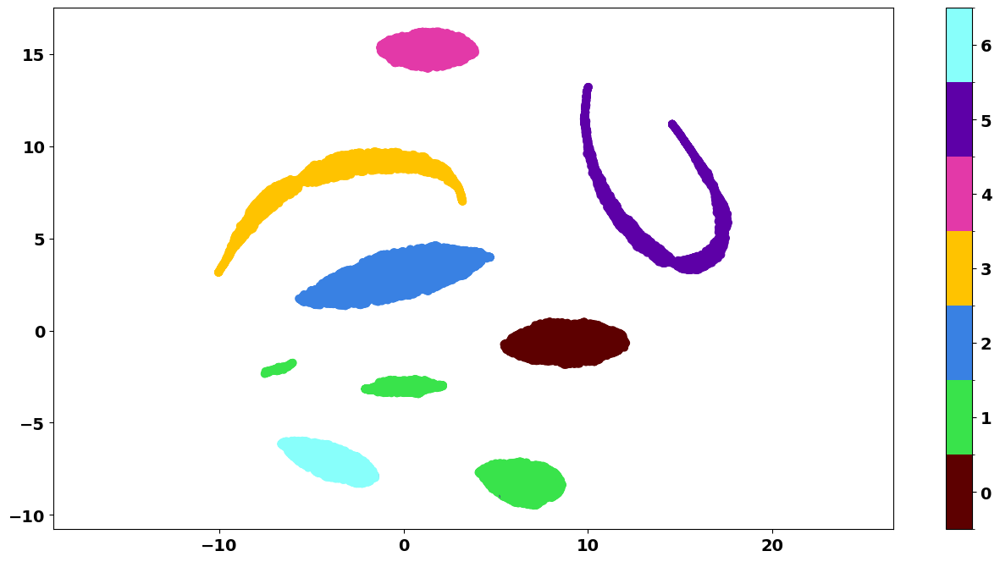

In [56]:
Functions.umap_plot(individuals.drop(['customer_name', 'region'], axis=1), 'segment')

<br>

---
<br>

<a class="anchor" id="4.-bullet">     
    

### 4. Profilling - Final Interpretation of the Segments

</a>

In [57]:
Functions.compare_clusters(individuals.drop(['birthday', 'customer_gender', 'birthmonth', 'lifetime_spend_meat', 'lifetime_spend_fish', 'latitude_encoded', 'longitude_encoded'], axis=1), ['segment'])

,0,1,2,3,4,5,6,general_mean
kids_home,1.000203,0.347051,0.997901,0.689588,3.077533,1.160423,0.162996,1.155404
teens_home,0.069904,0.349934,0.271620,0.068547,1.810880,0.771217,0.000000,0.516827
number_complaints,1.010567,0.628047,1.551008,0.500000,0.933176,0.310899,0.018502,0.770169
distinct_stores_visited,20.001829,1.926081,7.999580,1.992625,3.007282,2.000212,3.009692,6.159636
lifetime_spend_groceries,302.959764,414.263172,14993.307935,200.406291,4997.151424,997.506878,7000.099559,4008.813629
lifetime_spend_electronics,20.000000,369.151507,199.970403,4999.557484,200.242022,50.364656,1002.929075,972.556727
typical_hour,8.991668,16.123722,11.914568,20.951844,17.403298,9.983492,18.955066,14.461107
lifetime_spend_vegetables,300.231863,193.830406,799.560034,20.033623,601.983294,1499.006138,402.611454,568.474340
lifetime_spend_nonalcohol_drinks,300.431823,252.566448,900.786104,1500.946855,900.565217,20.204233,400.486344,633.505206
lifetime_spend_alcohol_drinks,199.776671,495.196855,599.145886,499.866161,500.867423,20.202328,402.963877,382.203433


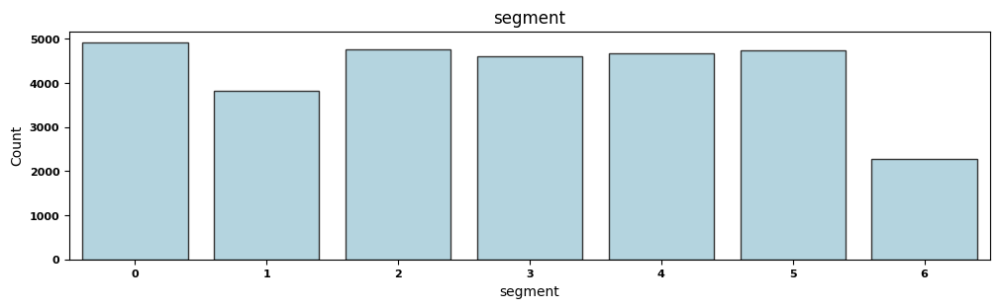

In [58]:
Functions.plot_bar_charts(individuals, ['segment'])

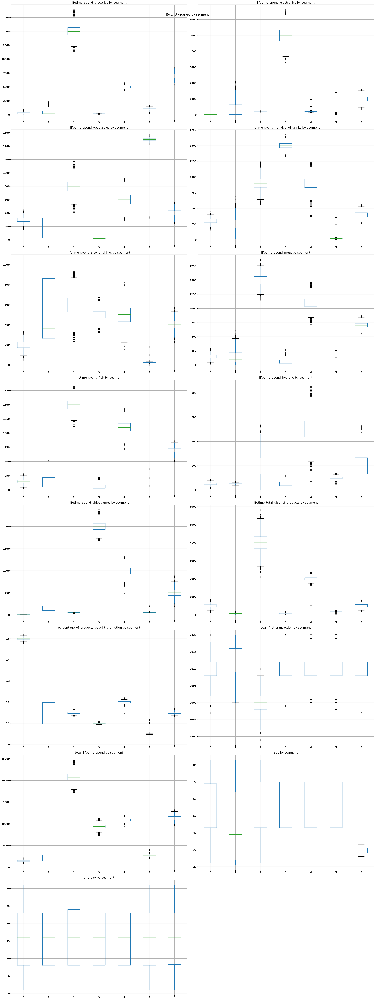

In [59]:
Functions.boxplot_by(individuals, continuous, 'segment')

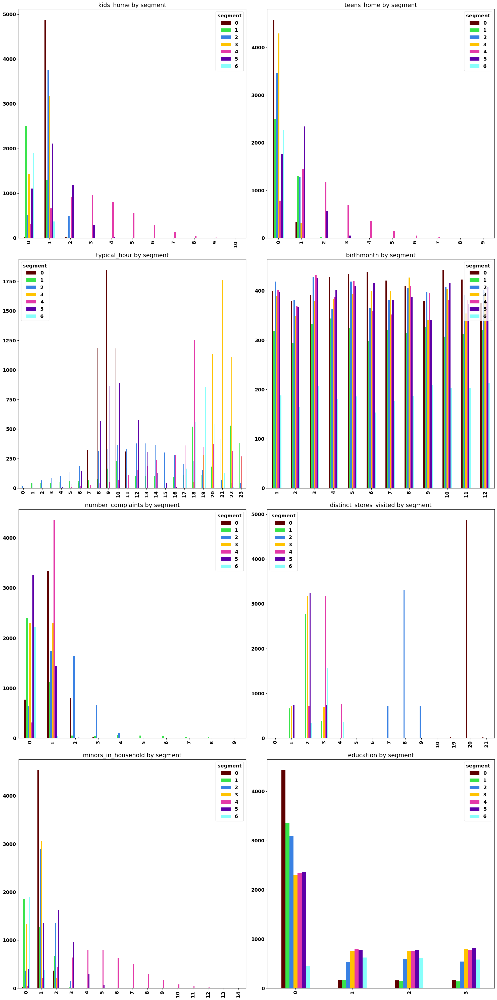

In [60]:
Functions.barplot_by(individuals, discrete, 'segment')

In [61]:
columns.append('segment')

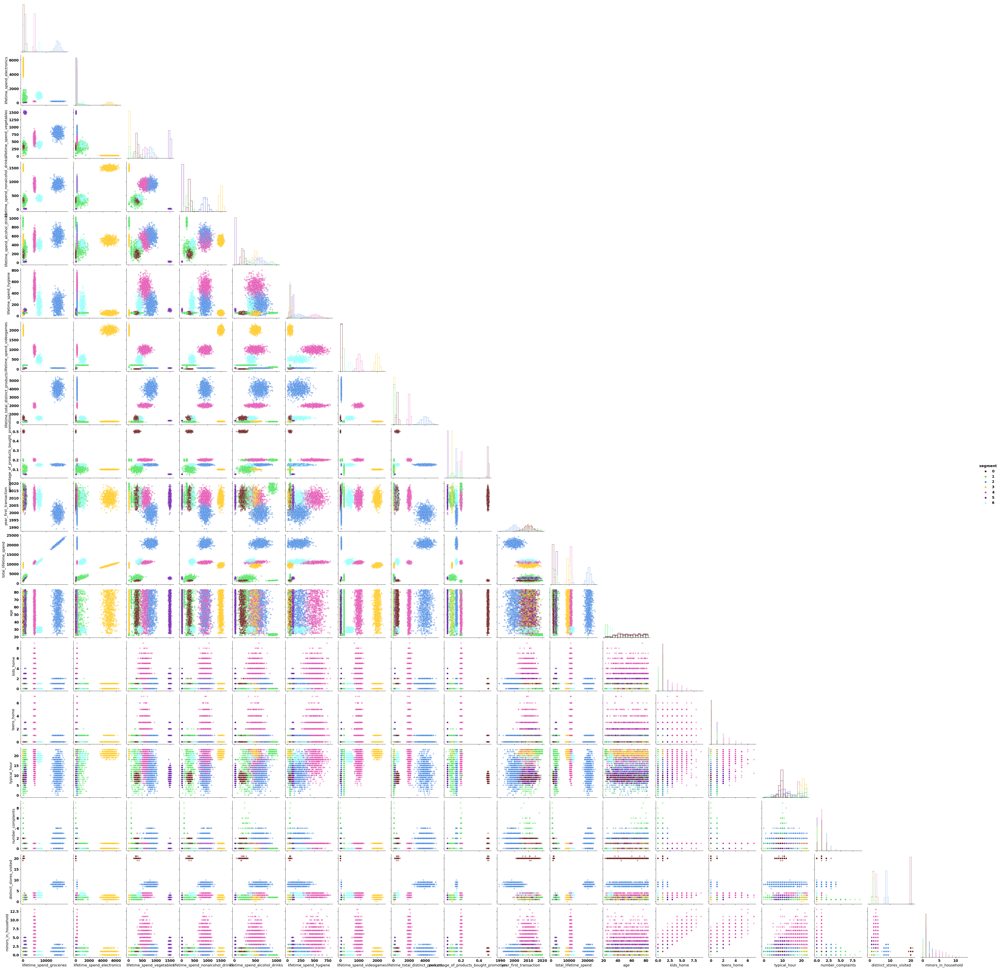

In [62]:
Functions.pairplot(individuals, columns, 'segment')

> Exporting the customer data with all segments

In [42]:
supermarkets = pd.read_csv('supermarkets preprocessed.csv')
supermarkets['segment'] = 7
supermarkets.set_index('customer_id', inplace=True)
customers = pd.concat([individuals, supermarkets], axis=0)
customers.to_csv('customers_clustered.csv', index=True)